In [1]:
import ReviewData as RD

In [7]:
bikeways = RD.readBikeFacility(add=False)

In [30]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns
import os

In [6]:
MPObd = gpd.read_file("V:/Data/Transportation/MPO_Bound.shp")

In [8]:
bikeways_cl = gpd.clip(bikeways, MPObd)

In [10]:
bikeways_cl.head()

,name,type,lane_type,source,geom
12,None,Bike Route,None,EUG,"LINESTRING (-13702263.711 5466263.878, -137022..."
9,0,Pedestrian and Bicycle Access Way,None,EUG,"LINESTRING (-13702576.270 5465896.860, -137025..."
10,0,Pedestrian and Bicycle Access Way,None,EUG,"LINESTRING (-13702498.076 5465965.954, -137024..."
14,None,Bike Route,None,LCOG,"LINESTRING (-13702689.071 5466338.715, -137025..."
2561,None,Bike Route,None,LCOG,"LINESTRING (-13702704.136 5466341.922, -137026..."


In [28]:
outpath = r"T:\DCProjects\StoryMap\BikeCounting\figures"

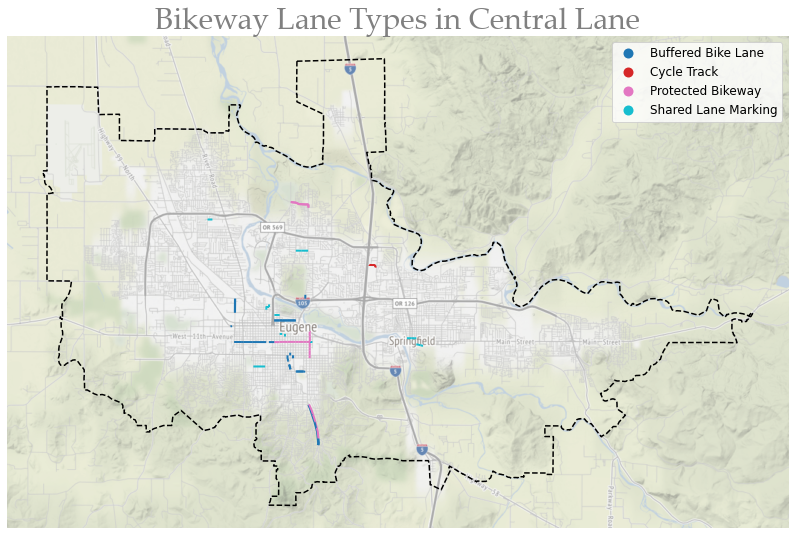

In [33]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl.plot(ax=ax, column='lane_type', cmap='tab10', legend=True, linewidth = 2, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Bikeway Lane Types in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "bikeway_lane_types.png"), transparent=True, bbox_inches='tight');

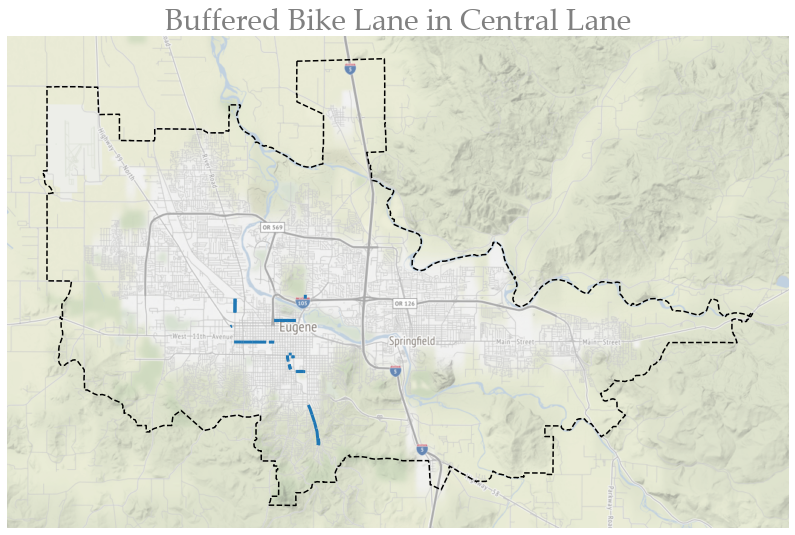

In [55]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl[bikeways_cl.lane_type=='Buffered Bike Lane'].plot(ax=ax, color='#1f77b4', linewidth = 3, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Buffered Bike Lane in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "Buffered_Bike_Lane.png"), transparent=True, bbox_inches='tight');

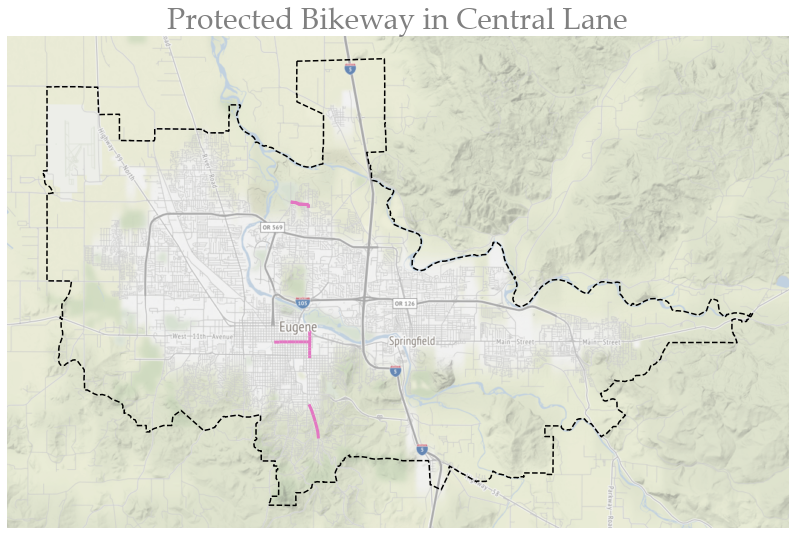

In [54]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl[bikeways_cl.lane_type=='Protected Bikeway'].plot(ax=ax, color='#e377c2', linewidth = 3, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Protected Bikeway in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "Protected_Bikeway.png"), transparent=True, bbox_inches='tight');

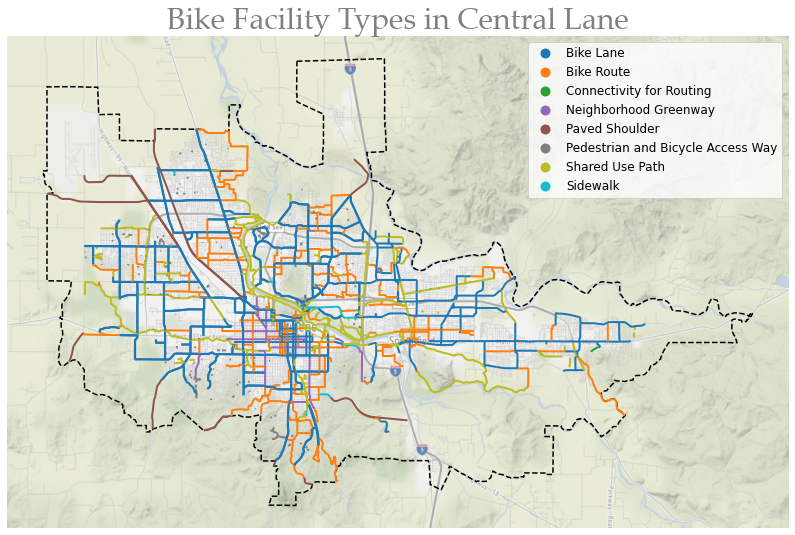

In [61]:
fig, ax = plt.subplots(figsize=(14, 12))
bikeways_cl.plot(ax=ax, column='type', cmap="tab10", legend=True, linewidth = 2, aspect=1)
MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
#ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
ctx.add_basemap(ax, alpha = 0.6, attribution=False)
ax.ticklabel_format(style='sci')
plt.title("Bike Facility Types in Central Lane", fontsize=30, fontname="Palatino Linotype", 
          color="grey")
ax.axis("off")
plt.savefig(os.path.join(outpath, "bikeway_types.png"), transparent=True, bbox_inches='tight');

In [58]:
palette = sns.color_palette("tab10", 8).as_hex()
print(palette)

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']


In [62]:
from pylab import *

In [65]:
cmap=cm.get_cmap('tab10', 8)

In [66]:
rgba = cmap(1)
matplotlib.colors.rgb2hex(rgba)

'#ff7f0e'

In [49]:
ftypes = sorted(bikeways_cl['type'].unique())

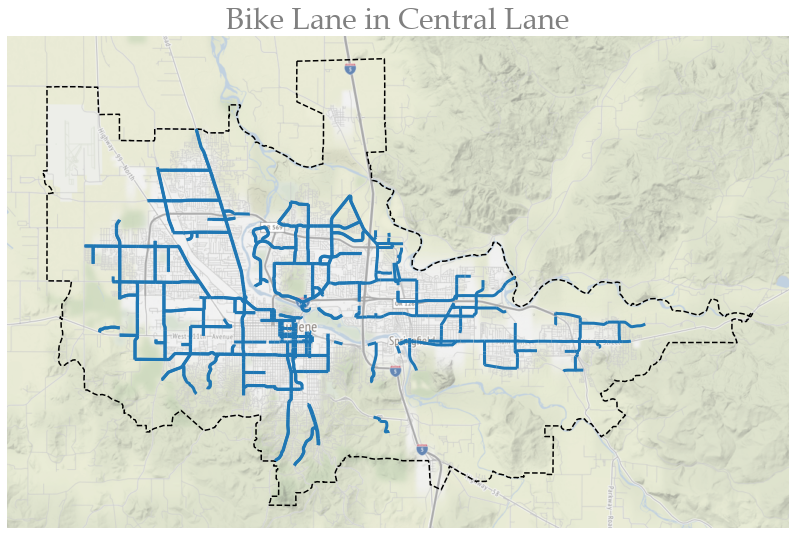

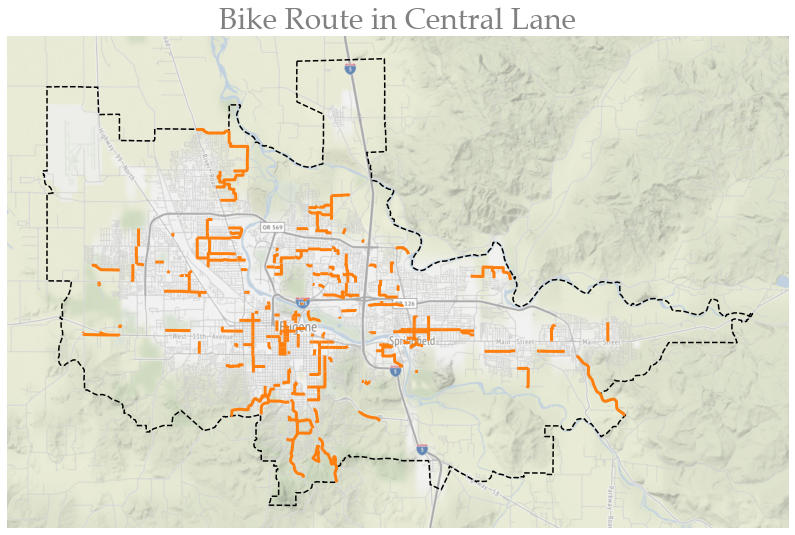

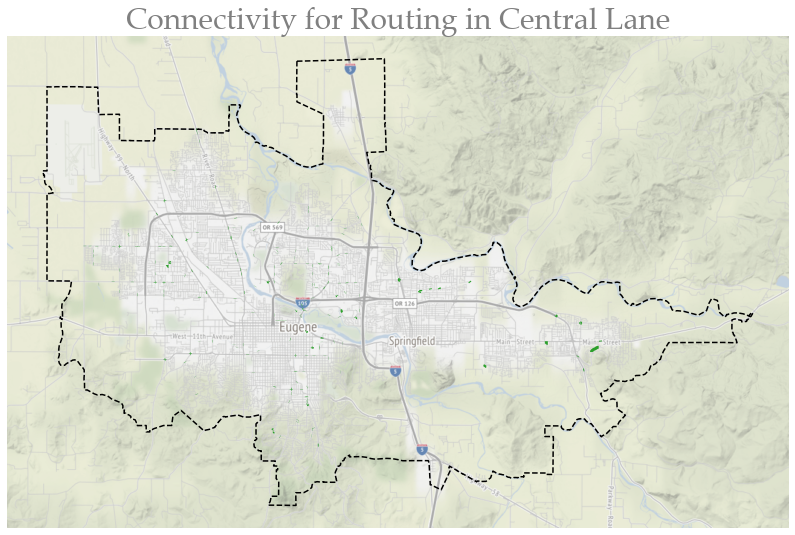

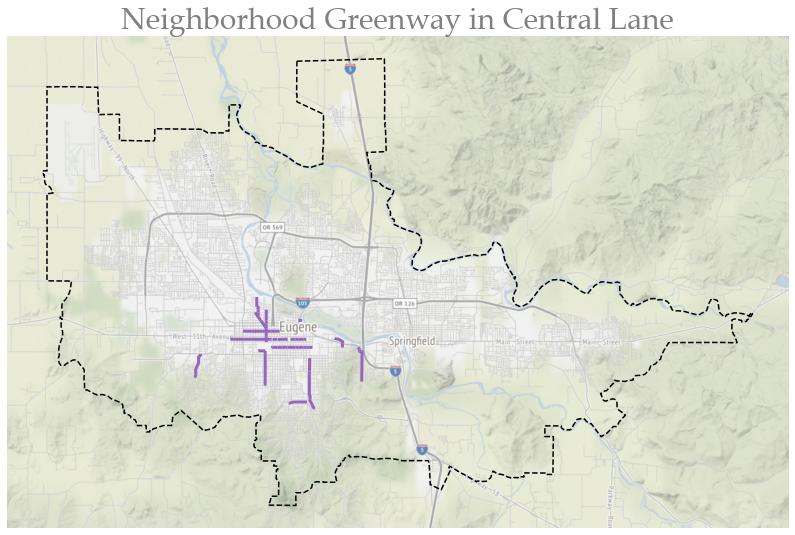

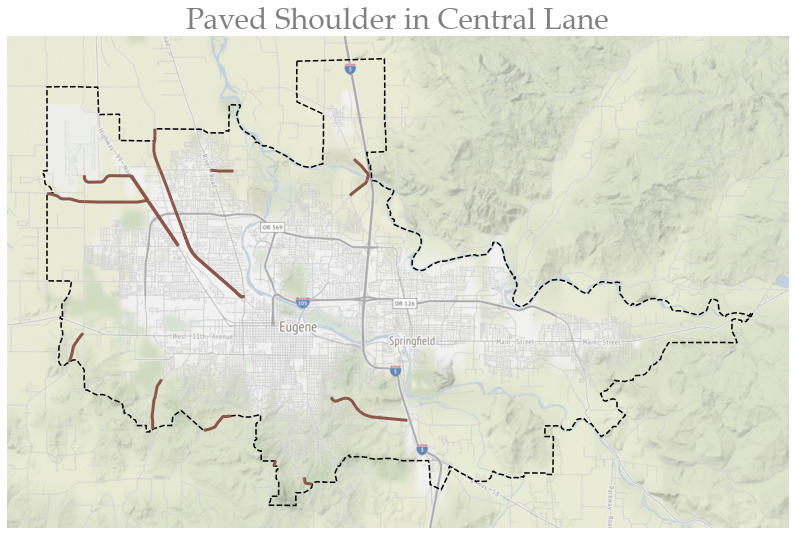

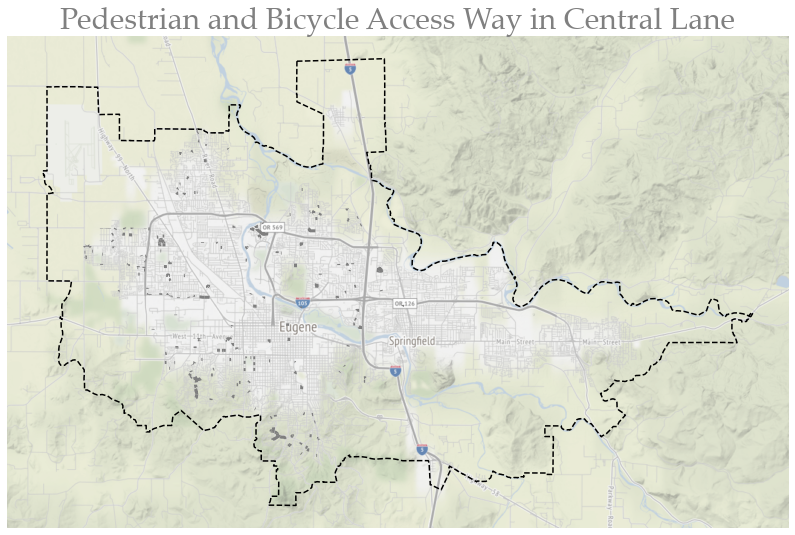

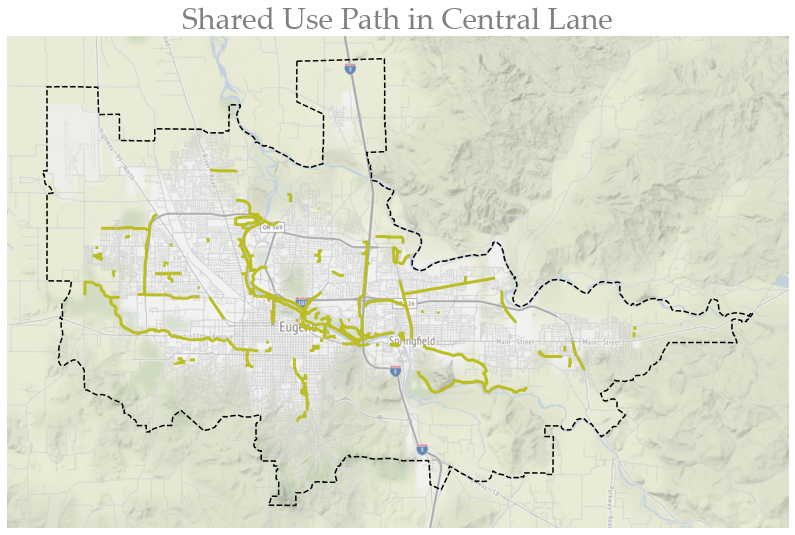

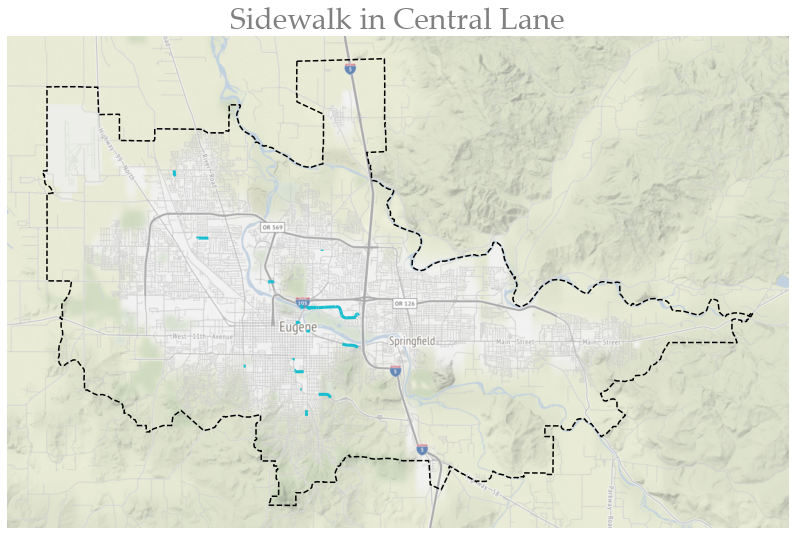

In [69]:
for i in range(0, 8):
    fig, ax = plt.subplots(figsize=(14, 12))
    rgba = cmap(i)
    bikeways_cl[bikeways_cl['type']==ftypes[i]].plot(ax=ax, color=matplotlib.colors.rgb2hex(rgba), linewidth = 3, aspect=1)
    MPObd.plot(ax=ax, facecolor="none", edgecolor="black", linestyle='--', linewidth = 1.5, aspect=1)
    #ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, attribution=False)
    ctx.add_basemap(ax, alpha = 0.6, attribution=False)
    ax.ticklabel_format(style='sci')
    plt.title("{0} in Central Lane".format(ftypes[i]), fontsize=30, fontname="Palatino Linotype", 
              color="grey")
    ax.axis("off")
    plt.savefig(os.path.join(outpath, "{0}.png".format(ftypes[i].replace(" ", "_"))), transparent=True, bbox_inches='tight');